# Steps for Applied Machine Learning (ML) for Hackathons :
   1. Understand the Problem Statement & Import Packages and Datasets.

   2. Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

       * Explore Train and Test Data and get to know what each Column / Feature denotes.
       * Check for Imbalance of Target Column in Datasets.
       * Visualize Count Plots & Unique Values to infer from Datasets.
   3. Check Duplicate Rows from Train Data if present.

   4. Fill/Impute Missing Values Continuous - Mean/Median/Any Specific Value & Categorical - Others/ForwardFill/BackFill.

   5. Feature Engineering

       * Feature Selection - Selection of Most Important Existing Features.
       * Feature Creation - Creation of New Feature from the Existing Features.
       * Split Train Data into Predictors(Independent) & Target(Dependent).

   6. Data Encoding - Label Encoding, OneHot Encoding and Data Scaling - MinMaxScaler, StandardScaler, RobustScaler
   7. Create Baseline ML Model for Binary Classification Problem.
   8. Improve ML Model with Voting Classifier with MODEL Evaluation METRIC - "F1" and Predict Target "is_promoted".
   9. Result Submission, Check Leaderboard & Improve "F1" Score

### 1. Understand the Problem Statement & Import Packages and Datasets

In [70]:
## Warning libraries:
import warnings
warnings.filterwarnings("ignore")

## Scientific and Data manipulation libraries
import pandas as pd
import numpy as np
import math
import os

## ML Libraries
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

## Classifier model library
from xgboost import XGBClassifier

## Data Visualization libraries:
import seaborn as sns
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

In [71]:
## Get current location path

print(os.getcwd())

G:\ML\Projects\HR analytics


In [72]:
## Set location path

os.chdir(r"G:\ML\Projects\HR analytics")

In [73]:
## Loading the csv file to pandas dataframe

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

display('\t\tTrain Dataset:\n', train.head(20))
display('\t\tTest Dataset:\n', test.head(20))

'\t\tTrain Dataset:\n'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
5,58896,Analytics,region_2,Bachelor's,m,sourcing,2,31,3.0,7,0,0,85,0
6,20379,Operations,region_20,Bachelor's,f,other,1,31,3.0,5,0,0,59,0
7,16290,Operations,region_34,Master's & above,m,sourcing,1,33,3.0,6,0,0,63,0
8,73202,Analytics,region_20,Bachelor's,m,other,1,28,4.0,5,0,0,83,0
9,28911,Sales & Marketing,region_1,Master's & above,m,sourcing,1,32,5.0,5,1,0,54,0


'\t\tTest Dataset:\n'

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61
5,46232,Procurement,region_7,Bachelor's,m,sourcing,1,36,3.0,2,0,0,68
6,54542,Finance,region_2,Bachelor's,m,other,1,33,5.0,3,1,0,57
7,67269,Analytics,region_22,Bachelor's,m,sourcing,2,36,3.0,3,0,0,85
8,66174,Technology,region_7,Master's & above,m,other,1,51,4.0,11,0,0,75
9,76303,Technology,region_22,Bachelor's,m,sourcing,1,29,5.0,2,1,0,76


### 2. Perform EDA (Exploratory Data Analysis) - Understanding the Datasets :

In [74]:
## Taking copy of train data

df = train.copy()

## Name of the columns
df.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [75]:
## Basic information

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [76]:
## Unique values in columns
def display_unique(data):
    for column in data.columns:
        
        print(f"Number of Unique values in {column} column are: {str(data[column].nunique())}. ")
        print(f"\nActual of Unique values in {column} column are: {str(data[column].sort_values(ascending=True, na_position='last').unique() ) }. ")
        print(" ")
        
        
display_unique(df)

Number of Unique values in employee_id column are: 54808. 

Actual of Unique values in employee_id column are: [    1     2     4 ... 78296 78297 78298]. 
 
Number of Unique values in department column are: 9. 

Actual of Unique values in department column are: ['Analytics' 'Finance' 'HR' 'Legal' 'Operations' 'Procurement' 'R&D'
 'Sales & Marketing' 'Technology']. 
 
Number of Unique values in region column are: 34. 

Actual of Unique values in region column are: ['region_1' 'region_10' 'region_11' 'region_12' 'region_13' 'region_14'
 'region_15' 'region_16' 'region_17' 'region_18' 'region_19' 'region_2'
 'region_20' 'region_21' 'region_22' 'region_23' 'region_24' 'region_25'
 'region_26' 'region_27' 'region_28' 'region_29' 'region_3' 'region_30'
 'region_31' 'region_32' 'region_33' 'region_34' 'region_4' 'region_5'
 'region_6' 'region_7' 'region_8' 'region_9']. 
 
Number of Unique values in education column are: 3. 

Actual of Unique values in education column are: ["Bachelor's" 'Belo

In [77]:
## Help(px.Colors.sequential)

fig = px.parallel_categories(df[['department','education','gender','previous_year_rating','KPIs_met >80%',
                                   'is_promoted']],
                            color='is_promoted',
                            color_continuous_scale=px.colors.sequential.Aggrnyl )

fig.show()

<AxesSubplot:>

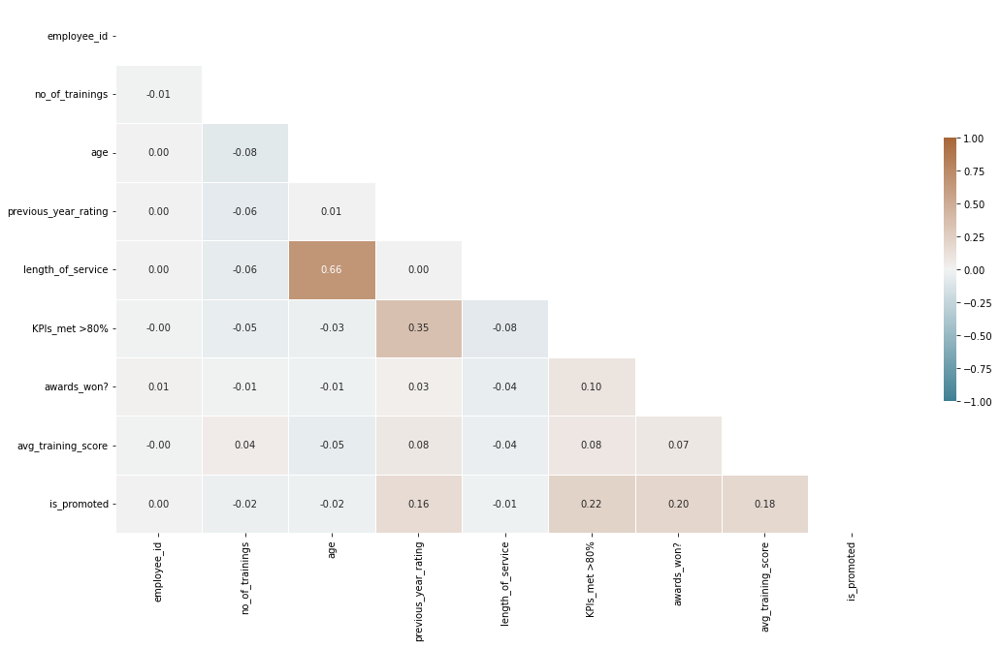

In [78]:
## Correlation vis

mat_corr = df.corr()
mask = np.triu(np.ones_like(mat_corr, dtype=bool))
cmap = sns.diverging_palette(220, 35, as_cmap=True)

sns.heatmap(mat_corr, mask=mask, cmap=cmap, vmax=1.0, vmin=-1.0, center=0.0, annot=True, fmt='.2f', linewidths=.5, cbar_kws={'shrink': .5})

#### Distribution of employees across various departments

In [79]:
df['department'].value_counts()

Sales & Marketing    16840
Operations           11348
Technology            7138
Procurement           7138
Analytics             5352
Finance               2536
HR                    2418
Legal                 1039
R&D                    999
Name: department, dtype: int64

**Observation** - 9 differenent in which "Sales&marketing", "operations", "Technology" etc have large number of employees.

#### Percentage of people who got promoted from each department

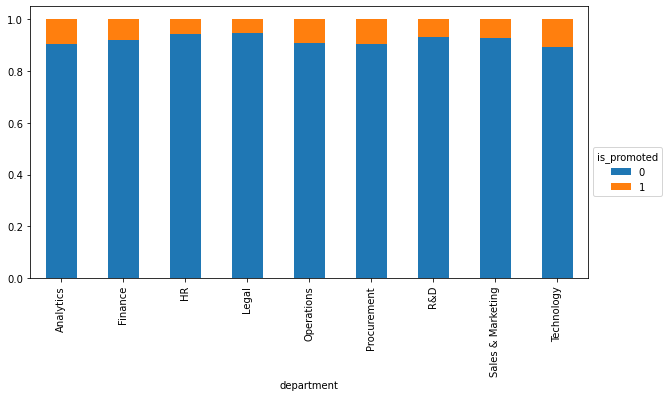

In [80]:
plt.rcParams['figure.figsize'] = [10, 5]

ct = pd.crosstab(df['department'], df['is_promoted'], normalize='index')

ct.plot.bar(stacked=True)

plt.legend(title='is_promoted', bbox_to_anchor=(1, 0.5))

**Observation** - Department such as "Technology", "Analytics" had high % of getting promoted whereas "Legal" department have lowest among all dept. in terms of getting promotions.

#### Percentage of promotions across all the regions

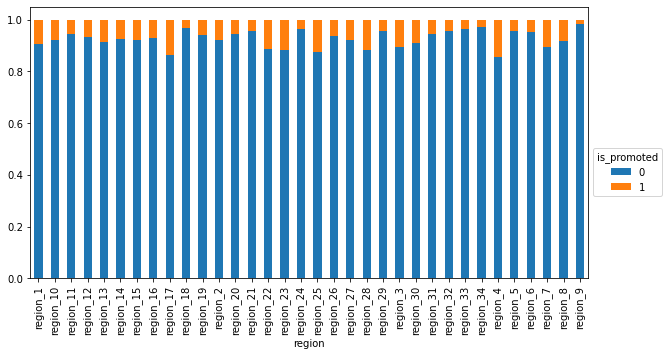

In [81]:
reg = pd.crosstab(df['region'], df['is_promoted'], normalize='index')
reg.plot.bar(stacked=True)

plt.legend(title='is_promoted', bbox_to_anchor=(1, 0.5))

**Observation** person's from region 17 & 34 have greater probability of getting promoted

#### Distribution of promotions among people eith different Educational backgrounds

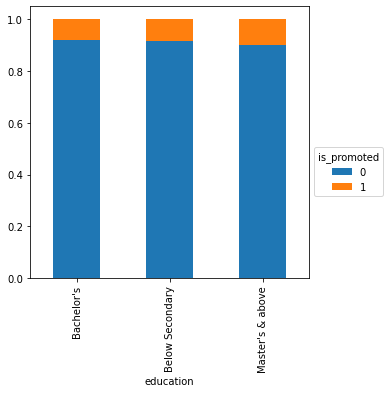

In [82]:
plt.rcParams['figure.figsize'] = [5, 5]

edu = pd.crosstab(df['education'], df['is_promoted'], normalize='index')

edu.plot.bar(stacked=True)
plt.rcParams['figure.figsize'] = [5, 5]
plt.legend(title='is_promoted', bbox_to_anchor=(1, 0.5))

**Observation** - getting promotion based on eductional range is same for Bachelors and below secondary, whereas Master's have high chance getting promoted.

#### Variation of promotion percentage w.r.t gender

In [83]:
pd.crosstab(df['gender'], df['is_promoted'], normalize=True)

is_promoted,0,1
gender,,
f,0.270855,0.026766
m,0.643975,0.058404


**Observation** - Major difference in percentages across gender too. 

#### Variation of promotion percentage with recruitment channel that they have come from 

In [84]:
pd.crosstab(df['recruitment_channel'], df['is_promoted'], normalize="index")

is_promoted,0,1
recruitment_channel,,
other,0.916048,0.083952
referred,0.879159,0.120841
sourcing,0.914987,0.085013


**Observation** - According to data, the % promotion is high for employees who have been recruited through referrals.

#### Variation of promotion percentage with respect to KPIs met or not

In [85]:
pd.crosstab(df['KPIs_met >80%'], df['is_promoted'], normalize='index')

is_promoted,0,1
KPIs_met >80%,,
0,0.960413,0.039587
1,0.830906,0.169094


**Observation** - % of employees got promotion is more for group of people whose KPIs is >= 80%.

#### Ratio difference across gender within the departments

In [86]:
sales = df[df['department']=='Sales & Marketing']
operations = df[df['department']=='Operations']
technology = df[df['department']=='Technology']
hr = df[df['department']=='HR']
fin = df[df['department']=='Finance']
legal = df[df['department']=='Legal']
RnD = df[df['department']=='R&D']
pd.crosstab(sales.gender,sales.is_promoted,normalize='index')

is_promoted,0,1
gender,,
f,0.944198,0.055802
m,0.924229,0.075771


In [87]:
pd.crosstab(operations.gender, operations.is_promoted, normalize='index')

is_promoted,0,1
gender,,
f,0.905495,0.094505
m,0.912907,0.087093


In [88]:
pd.crosstab(technology.gender, technology.is_promoted, normalize='index')

is_promoted,0,1
gender,,
f,0.900646,0.099354
m,0.887126,0.112874


In [89]:
pd.crosstab(hr.gender, hr.is_promoted, normalize='index')

is_promoted,0,1
gender,,
f,0.942346,0.057654
m,0.944759,0.055241


In [90]:
pd.crosstab(fin.gender, fin.is_promoted, normalize='index')

is_promoted,0,1
gender,,
f,0.919236,0.080764
m,0.918598,0.081402


In [91]:
pd.crosstab(legal.gender, legal.is_promoted, normalize='index')

is_promoted,0,1
gender,,
f,0.959732,0.040268
m,0.947191,0.052809


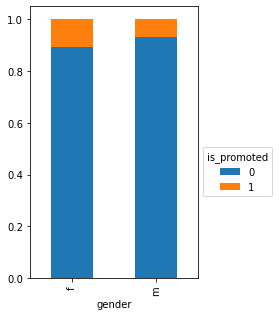

In [92]:
plt.rcParams['figure.figsize'] = [3, 5]

gender = pd.crosstab(RnD.gender, RnD.is_promoted, normalize='index')

gender.plot.bar(stacked=True)

plt.legend(title="is_promoted", loc="upper left", bbox_to_anchor=(1, 0.5))

**observation** - except the `operations`, `hr` dept. all other dept have for female employees have less or equal chances as compare to male.

#### Difference in the percentage of promoted employees with respect to previous year ratings

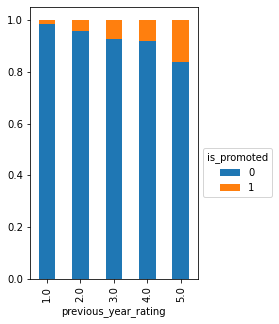

In [93]:
ratings = pd.crosstab(df['previous_year_rating'], df['is_promoted'], normalize='index')

ratings.plot.bar(stacked=True)
plt.legend(title='is_promoted', loc='upper left', bbox_to_anchor=(1, 0.5))

**Observation** - As rating increases more probablity of being promoted

#### Distribution of average training score

In [94]:
bins = [30, 40, 50, 60, 70, 80, 90, 100]
labels = ['30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100']

df['score_binned'] = pd.cut(df['avg_training_score'], bins=bins, labels=labels)

df['score_binned'].value_counts()

50-60     16020
40-50     11996
60-70      9973
80-90      8739
70-80      7494
90-100      579
30-40         7
Name: score_binned, dtype: int64

**Obervation** - Most or average number of employees have score of between 40-80, the least score range has very faint number or very low.

#### Distribution of promoted employees ratio across different score ranges

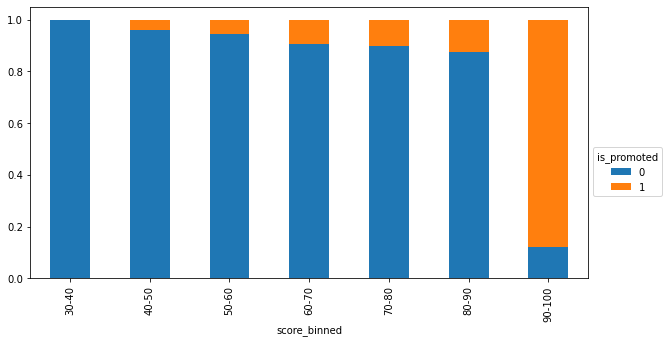

In [95]:
plt.rcParams['figure.figsize'] = [10, 5]
score_bin = pd.crosstab(df['score_binned'], df['is_promoted'], normalize='index')

score_bin.plot.bar(stacked=True)
plt.legend(title='is_promoted', loc='upper left', bbox_to_anchor=(1, 0.5))

**Observations** - Promotions is very high for employees which are in the range of 90-100.

#### Distribution of promotion ratios with respect to age

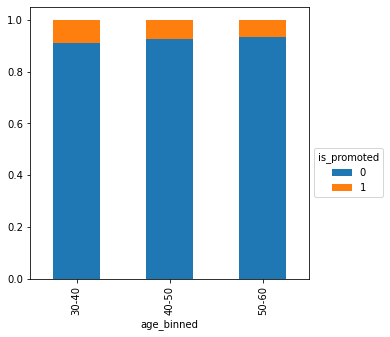

In [96]:
plt.rcParams['figure.figsize'] = [5, 5]
age_bins = [20, 30, 40, 50, 60]

age_labels = ['20-30', '30-40', '40-50', '50-60']
df['age_binned'] = pd.cut(df['age'], bins=bins, labels=labels)
df['age_binned'].value_counts()
age_bin = pd.crosstab(df['age_binned'], df['is_promoted'], normalize='index')

age_bin.plot.bar(stacked=True)
plt.rcParams['figure.figsize'] = [5, 5]
plt.legend(title='is_promoted', loc='upper left', bbox_to_anchor=(1, 0.5))

**Obervation** - Not much change in ratio of getting promotion and age ranges.

<AxesSubplot:xlabel='age', ylabel='avg_training_score'>

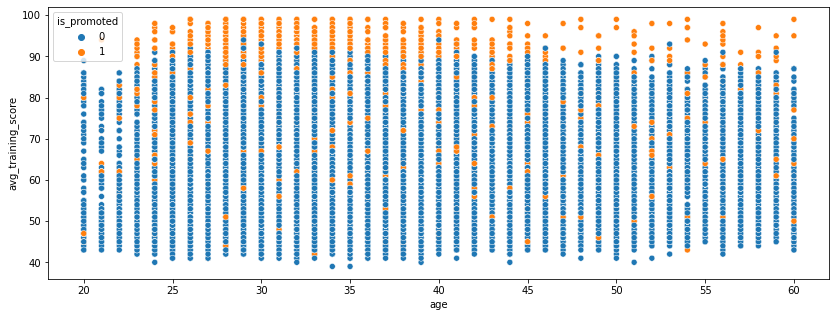

In [97]:
plt.rcParams['figure.figsize'] = [14, 5]

sns.scatterplot(x='age', y='avg_training_score', hue='is_promoted', data=df)

**Observation** - This graph tells me that promotion mainly depends on scores not on age.

#### Mean score of employees with different educational background

In [98]:
df.groupby(['education'])['avg_training_score'].mean()

education
Bachelor's          63.422046
Below Secondary     64.925466
Master's & above    64.061240
Name: avg_training_score, dtype: float64

**observation** - Mean training scores doesn't vary with education

### Filling the missing values

In [99]:
df.isna().sum()

employee_id                 0
department                  0
region                      0
education                2409
gender                      0
recruitment_channel         0
no_of_trainings             0
age                         0
previous_year_rating     4124
length_of_service           0
KPIs_met >80%               0
awards_won?                 0
avg_training_score          0
is_promoted                 0
score_binned                0
age_binned              18118
dtype: int64

**Observation** - Columns such as `education`, `previous_year_rating`, and `age_binned` columns have missing values.

In [100]:
## Handlings the missings values
df['previous_year_rating'] = df.groupby(['KPIs_met >80%'])["previous_year_rating"].apply(lambda x: x.fillna(x.mean()))

df['education'] = df['education'].astype('object')
df['education'] = df.groupby(["department"])["education"].apply(lambda x: x.fillna(x.value_counts().index[0]))

### Feature Engineering

Normalize all the numerical features and encode all the categorical features.

In [101]:
scaled_features = df.copy()

col_names = ['no_of_trainings', 'age','previous_year_rating','length_of_service','awards_won?','avg_training_score']
label_names = ['department','gender','recruitment_channel','region']

features = scaled_features[col_names]
scaler = preprocessing.StandardScaler().fit(features.values)

features = scaler.transform(features.values)
scaled_features = pd.get_dummies(scaled_features, columns=label_names, drop_first=True)

scaled_features[col_names] = features
scaled_features.drop(columns=['employee_id','age','education','score_binned','age_binned'], inplace=True)

The transformed features are fit to a Gradient Boosting Algorithm. Grid Search cross validation is used to find the best hyperparameter('n_estimators').

In [102]:
X_train, X_test, y_train, y_test = train_test_split(scaled_features.loc[:, scaled_features.columns != 'is_promoted'], scaled_features['is_promoted'], test_size=0.33, random_state=42)

#
gbc = GradientBoostingClassifier(loss='exponential', max_features='auto')
param_grid = {
    'n_estimators': [200, 500, 800]
}

grid_search = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

## Fit and Transform grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 3 candidates, totalling 9 fits


{'n_estimators': 500}

According to the results of grid search, 500 is the optimal number of estimators.

#### Finding features importances

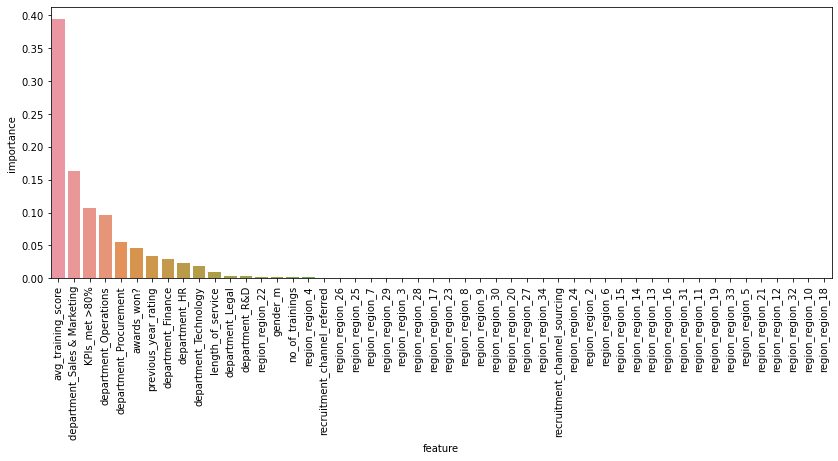

In [103]:
feature_importances = grid_search.best_estimator_.feature_importances_

feature_importance = {}

for i in range(len(X_train.columns)):
    feature_importance[X_train.columns[i]] = feature_importances[i]
    importance_df = pd.DataFrame(list(feature_importance.items()), columns=['feature', 'importance'])
    importance_df = importance_df.sort_values('importance', ascending=False)
    
    plt.xticks(rotation='vertical')
    plt.rcParams['figure.figsize'] = [18, 10]
    sns.barplot(x='feature', y='importance', data=importance_df)

The above graph shows the importance of each feature in building the model.

In [104]:
pred = grid_search.predict(X_test)
accuracy = metrics.accuracy_score(y_test, pred)

'accuracy - ' + str(accuracy)

'accuracy - 0.9451539779952453'

In [105]:
f1 = metrics.f1_score(y_test, pred)

'f1 score - ' + str(f1)

'f1 score - 0.5122910521140609'

In [106]:
recall = metrics.recall_score(y_test, pred)

'recall - ' + str(recall)

'recall - 0.35345997286295794'

In [107]:
precision = metrics.precision_score(y_test, pred)

'precision - ' + str(precision)

'precision - 0.9303571428571429'

**The model has high accuracy but F1 score is less beacause of lessor Recall value. This means that number of False Negatives are higher which might have arised due to unbalanced classes. Oversampling or Undersampling might increase F1 score**

## Submission

using test.csv file

In [108]:
display(test.head(10))

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61
5,46232,Procurement,region_7,Bachelor's,m,sourcing,1,36,3.0,2,0,0,68
6,54542,Finance,region_2,Bachelor's,m,other,1,33,5.0,3,1,0,57
7,67269,Analytics,region_22,Bachelor's,m,sourcing,2,36,3.0,3,0,0,85
8,66174,Technology,region_7,Master's & above,m,other,1,51,4.0,11,0,0,75
9,76303,Technology,region_22,Bachelor's,m,sourcing,1,29,5.0,2,1,0,76


In [109]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           23490 non-null  int64  
 1   department            23490 non-null  object 
 2   region                23490 non-null  object 
 3   education             22456 non-null  object 
 4   gender                23490 non-null  object 
 5   recruitment_channel   23490 non-null  object 
 6   no_of_trainings       23490 non-null  int64  
 7   age                   23490 non-null  int64  
 8   previous_year_rating  21678 non-null  float64
 9   length_of_service     23490 non-null  int64  
 10  KPIs_met >80%         23490 non-null  int64  
 11  awards_won?           23490 non-null  int64  
 12  avg_training_score    23490 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 2.3+ MB


In [110]:
test.isna().sum()

employee_id                0
department                 0
region                     0
education               1034
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    1812
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

In [111]:
## Adding the score_binned columns

bins = [30, 40, 50, 60, 70, 80, 90, 100]
labels = ['30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100']

test['score_binned'] = pd.cut(test['avg_training_score'], bins=bins, labels=labels)

test['score_binned'].value_counts()

50-60     6762
40-50     5321
60-70     4236
80-90     3700
70-80     3230
90-100     237
30-40        4
Name: score_binned, dtype: int64

In [112]:
test.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'score_binned'],
      dtype='object')

In [113]:
display(test.head(20))

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,score_binned
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77,70-80
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51,50-60
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47,40-50
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65,60-70
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61,60-70
5,46232,Procurement,region_7,Bachelor's,m,sourcing,1,36,3.0,2,0,0,68,60-70
6,54542,Finance,region_2,Bachelor's,m,other,1,33,5.0,3,1,0,57,50-60
7,67269,Analytics,region_22,Bachelor's,m,sourcing,2,36,3.0,3,0,0,85,80-90
8,66174,Technology,region_7,Master's & above,m,other,1,51,4.0,11,0,0,75,70-80
9,76303,Technology,region_22,Bachelor's,m,sourcing,1,29,5.0,2,1,0,76,70-80


In [114]:
## Adding the age-binned columns

age_bins = [20, 30, 40, 50, 60]
age_labels = ['20-30', '30-40', '40-50', '50-60']

test['age_binned'] = pd.cut(test['age'], bins=age_bins, labels=age_labels)
test['age_binned'].value_counts()

30-40    11093
20-30     7777
40-50     3321
50-60     1248
Name: age_binned, dtype: int64

In [115]:
## Handling the missing values

test['previous_year_rating'] = test.groupby(["KPIs_met >80%"])["previous_year_rating"].apply(lambda x: x.fillna(x.mean()))

test["education"] = test["education"].astype("object")
test["education"] = test.groupby(["department"])["education"].apply(lambda x: x.fillna(x.value_counts().index[0]))

In [116]:
test_scaled_feat = test.copy()

feat = test_scaled_feat[col_names]
test_feat = scaler.transform(feat.values)

test_scaled_feat = pd.get_dummies(test_scaled_feat, columns=label_names, drop_first=True)

test_scaled_feat[col_names] = feat
test_scaled_feat.drop(columns=['employee_id','age','education','score_binned','age_binned'], inplace=True)

In [117]:
test_scaled_feat.head()

,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Finance,department_HR,department_Legal,department_Operations,...,region_region_31,region_region_32,region_region_33,region_region_34,region_region_4,region_region_5,region_region_6,region_region_7,region_region_8,region_region_9
0,1,3.928819,1,1,0,77,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,3.000000,5,0,0,51,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
2,1,1.000000,4,0,0,47,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,2.000000,9,0,0,65,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,4.000000,7,0,0,61,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [118]:
test_pred = grid_search.predict(test_scaled_feat)

test_pred[: 20]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int64)

In [119]:
out = pd.DataFrame({
    'employee_id': test['employee_id'],
    'is_promoted': test_pred
})

out.head()

,employee_id,is_promoted
0,8724,1
1,74430,1
2,72255,1
3,38562,1
4,64486,1


In [120]:
out.to_csv("submission_HR_prediction.csv", index=False)

print("HR_BEST_MODEL_SUCESSFULL")

HR_BEST_MODEL_SUCESSFULL


# Model Deployment



In [134]:
import os

path = os.getcwd()

path

'G:\\ML\\Projects\\HR analytics'

In [135]:
import joblib

joblib.dump(grid_search, path+"\HR Analytics\Grid_Search.pkl" )

print("Success fully pickled")

Success fully pickled


In [136]:
"G:/ML/Projects/HR analytics/HR Analytics"

'G:/ML/Projects/HR analytics/HR Analytics'

### ==============================================

**Uniques values Dataframe**

In [137]:
# test_df = pd.read_csv('test.csv')

# test_df.head()

In [138]:
# df.info()

In [139]:
# display_unique(test_df)

In [140]:
# list(test_df['employee_id'].unique())

In [141]:
# test_df.columns

In [142]:
# name = "shubham"
# name = [name]

In [143]:
# data = pd.DataFrame({
#     "Name": [str(name)],
#     "id": [int("123")]
# })

# data.head()

In [144]:
# data["Emp_id"] = 2

# data.head()

In [145]:
## Processing the new data
def processing(test_data):
    col = ['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'score_binned']
    
    label_names = ['department', 'gender', 'recruitment_channel', 'region']
    col_names = ['no_of_trainings', 'age', 'previous_year_rating', 'length_of_service', 'awards_won?', 'avg_training_score']
    
    test = test_data[col]
    ## Adding the score_binned columns
    bins = [30, 40, 50, 60, 70, 80, 90, 100]
    labels = ['30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100']

    test['score_binned'] = pd.cut(test['avg_training_score'], bins=bins, labels=labels)
    test['score_binned'].value_counts()
    

    ## Adding the age-binned columns
    age_bins = [20, 30, 40, 50, 60]
    age_labels = ['20-30', '30-40', '40-50', '50-60']

    test['age_binned'] = pd.cut(test['age'], bins=age_bins, labels=age_labels)
    test['age_binned'].value_counts()
    
    
    ## Handling the missing values

    test['previous_year_rating'] = test.groupby(["KPIs_met >80%"])["previous_year_rating"].apply(lambda x: x.fillna(x.mean()))

    test["education"] = test["education"].astype("object")
    test["education"] = test.groupby(["department"])["education"].apply(lambda x: x.fillna(x.value_counts().index[0]))
    
    
    ## Scaling the data
    test_scaled_feat = test.copy()

    feat = test_scaled_feat[col_names]
    test_feat = scaler.transform(feat.values)

    test_scaled_feat = pd.get_dummies(test_scaled_feat, columns=label_names, drop_first=True)

    test_scaled_feat[col_names] = feat
    test_scaled_feat.drop(columns=['employee_id','age','education','score_binned','age_binned'], inplace=True)
    
    return test_scaled_feat

In [146]:
joblib.dump(processing, path+"\HR Analytics\processing.pkl")

print("Success fully pickled processing function")

Success fully pickled processing function
